In [2]:
import os
from tqdm import tqdm
# from google.colab import drive
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image


device = 'cpu'
if torch.cuda.is_available():
    device = 'cuda'

# drive.mount('/content/drive')
dataset_path = './dataset/'
project_path = './'
models_path = './models/'
%matplotlib inline

# Downloading and formatting dataset

In [3]:
import os
import requests
from bs4 import BeautifulSoup
from urllib.parse import urljoin
from urllib.request import urlretrieve

def download_dataset(path):
  for i in range(1,50+1):
      baseurl = "https://anniversaire-celebrite.com/"
      url = f"https://anniversaire-celebrite.com/pays/france-{i}"
      # url = f"https://anniversaire-celebrite.com/pays/etats-unis-{i}"

      os.makedirs(dataset_path, exist_ok=True)

      response = requests.get(url)
      soup = BeautifulSoup(response.text, "html.parser")
      image_tags = soup.find_all("img")

      for img in image_tags:
          img_url = img.get("src")
          if img_url and "jpg" in img_url:
              img_url = baseurl + img_url
              try:
                  img_filename = os.path.join(path, os.path.basename(img_url))
                  urlretrieve(img_url, img_filename)
                  print(f"Downloaded: {img_filename}")
              except Exception as e:
                  print(f"Could not download {img_url}. Error: {e}")


# download_dataset(dataset_path + "raw/")

In [4]:
from PIL import Image


def crop_to_square(image):
    width, height = image.size
    new_size = min(width, height)
    left = (width - new_size) / 2
    top = (height - new_size) / 2
    right = (width + new_size) / 2
    bottom = (height + new_size) / 2
    return image.crop((left, top, right, bottom))

def process_images(path):
    for filename in os.listdir(path):
      img_path = os.path.join(path, filename)
      if not filename.endswith(".jpg"):
        continue
      try:
          img = Image.open(img_path).convert('RGB')
          new_filename = filename.replace("-250", "")
          new_filename = os.path.splitext(new_filename)[0] + ".png"
          new_img_path = os.path.join(path, new_filename)
          img.save(new_img_path, "png")
          os.remove(img_path)
          print(f"Processed : {filename} -> {new_filename}")
      except Exception as e:
          print(f"Error processing {filename}: {e}")

# process_images(dataset_path + "raw/")

In [5]:
import os
import cv2
import dlib
import numpy as np

def align_faces(old_path, new_path, output_size=(250, 250)):

    detector = dlib.get_frontal_face_detector()
    predictor = dlib.shape_predictor(project_path + "shape_predictor_68_face_landmarks.dat")

    desired_left_eye = (output_size[0] * 0.3, output_size[1] * 0.4)
    desired_right_eye = (output_size[0] * 0.7, output_size[1] * 0.4)
    desired_mouth = (output_size[0] * 0.5, output_size[1] * 0.7)

    for file_name in os.listdir(old_path):
        if not ("gabi" in file_name):
          continue
        input_path = os.path.join(old_path, file_name)
        output_path = os.path.join(new_path, file_name)

        image = cv2.imread(input_path)
        if image is None:
            print(f"Skipping file {file_name}, unable to load image.")
            continue

        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        faces = detector(gray)

        if len(faces) == 0:
            print(f"No faces detected in {file_name}.")
            continue

        # Only one face for each image
        face = faces[0]
        landmarks = predictor(gray, face)

        points = np.array([[landmarks.part(i).x, landmarks.part(i).y] for i in range(68)])
        # Average position of left eye points
        left_eye = points[36:42].mean(axis=0)
        # Average position of right eye points
        right_eye = points[42:48].mean(axis=0)
        # Average position of mouth points
        mouth = points[48:68].mean(axis=0)

        # Calculate affine transformation matrix to go from source to desired position
        src_points = np.array([left_eye, right_eye, mouth], dtype=np.float32)
        dst_points = np.array([desired_left_eye, desired_right_eye, desired_mouth], dtype=np.float32)
        transformation_matrix = cv2.getAffineTransform(src_points, dst_points)

        aligned_face = cv2.warpAffine(image, transformation_matrix, output_size)

        cv2.imwrite(output_path, aligned_face)
        cropped_image = crop_to_square(Image.open(output_path))
        cropped_image.save(output_path)
        print(f"Processed : {file_name}")


# align_faces(dataset_path + "raw/", dataset_path + "raw_aligned/")
# align_faces(dataset_path + "test/", dataset_path + "test/")

ModuleNotFoundError: No module named 'dlib'

In [6]:
from PIL import Image
import os


def downsample_image(old_img_path, new_path, size=64):
    img = Image.open(old_img_path)
    if img.size[0] != img.size[1]:
        img = crop_to_square(img)
    img = img.resize((size, size))
    name = os.path.splitext(os.path.basename(old_img_path))[0]
    new_filename = f"{size}_{name}.png"
    new_img_path = os.path.join(new_path, new_filename)
    img.save(new_img_path)
    print(f"Downsampled : {name} -> {size}_{name}")

def downsample_images(old_path, new_path, size=64):
    for filename in os.listdir(old_path):
        if not ("gabi" in filename):
          continue
        if filename.lower().endswith(('.png')):
            try:
                downsample_image(old_path + filename, new_path, size)
                # print(old_path + filename)
            except Exception as e:
              print(f"Error downsampling {filename}: {e}")


# downsample_images(dataset_path + "raw_aligned/", dataset_path + "64_aligned/", 64)
# downsample_images(dataset_path + "raw/", dataset_path + "64/", 64)
# downsample_images(dataset_path + "raw_aligned/", dataset_path + "128_aligned/", 128)

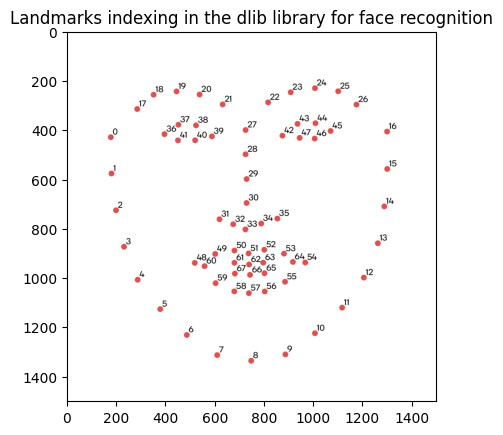

In [ ]:
image_path = os.path.join(project_path, 'facial_landmarks.png')
img = plt.imread(image_path)
plt.title("Landmarks idexing in the dlib library for face recognition")
plt.imshow(img)
plt.show()

# Face Dataset

In [7]:
import os
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import numpy as np


class FaceDataset(Dataset):
    def __init__(self, dataset_path, transform=None):
        self.dataset_path = dataset_path
        self.transform = transform
        self.image_files = [f for f in os.listdir(dataset_path)]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.dataset_path, self.image_files[idx])
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# AutoEncoder

## Training / Defining model

In [8]:
class Encoder64(nn.Module):
    def __init__(self, feature_dim):
        super(Encoder64, self).__init__()
        # Divide size of the image by two for each convolution (stride=2)
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten(),
                      # 256 channels with an 8x8 image (64/8 = 8)
            nn.Linear(256 * 8 * 8, feature_dim)
        )

    def forward(self, x):
        return self.encoder(x)

class Decoder64(nn.Module):
    def __init__(self, feature_dim):
        super(Decoder64, self).__init__()
        self.fc = nn.Linear(feature_dim, 256 * 8 * 8)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.fc(x)
        x = x.view(x.size(0), 256, 8, 8)
        return self.decoder(x)

class Autoencoder64(nn.Module):
    def __init__(self, feature_dim):
        super(Autoencoder64, self).__init__()
        self.encoder = Encoder64(feature_dim)
        self.decoder = Decoder64(feature_dim)

    def get_features(self, x):
        return self.encoder(x)

    def get_reconstruction(self, x):
        return self.decoder(x)

    def forward(self, x):
        features = self.encoder(x)
        reconstruction = self.decoder(features)
        return features, reconstruction


In [11]:
class Encoder128(nn.Module):
    def __init__(self, feature_dim):
        super(Encoder128, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
        )
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(1024 * 8 * 8, feature_dim)


    def forward(self, x):
        x = self.encoder(x)
        x = self.flatten(x)
        return self.fc(x)

class Decoder128(nn.Module):
    def __init__(self, feature_dim):
        super(Decoder128, self).__init__()
        self.fc = nn.Linear(feature_dim, 1024 * 8 * 8)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 3, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.fc(x)
        x = x.view(x.size(0), 1024, 8, 8)
        return self.decoder(x)

class Autoencoder128(nn.Module):
    def __init__(self, feature_dim):
        super(Autoencoder128, self).__init__()
        self.encoder = Encoder128(feature_dim)
        self.decoder = Decoder128(feature_dim)

    def get_features(self, x):
        return self.encoder(x)

    def get_reconstruction(self, x):
        return self.decoder(x)

    def forward(self, x):
        features = self.encoder(x)
        reconstruction = self.decoder(features)
        return features, reconstruction

In [ ]:
def train_autoencoder(data_path, feature_dim=100, batch_size=32, epochs=20, lr=1e-3, title="", img_size=64):
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
    ])

    dataset = FaceDataset(data_path, transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    model = Autoencoder64(feature_dim).to(device)
    if img_size == 128:
        model = Autoencoder128(feature_dim).to(device)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        for images in tqdm(dataloader):
            images = images.to(device)
            optimizer.zero_grad()
            _, reconstructions = model(images)
            loss = criterion(reconstructions, images)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

        print(f"Epoch {epoch+1}/{epochs}, Loss: {epoch_loss/len(dataloader)}")

    model_name = f"{title}_{os.path.basename(os.path.normpath(data_path))}_autoencoder_{feature_dim}_{epochs}_{lr}.pth"
    torch.save(model.state_dict(), models_path + model_name)
    print(f"Training complete, model saved : {model_name}")


In [ ]:
# train_autoencoder(dataset_path + "64_aligned/images", title="test1",feature_dim=100,epochs=10,batch_size=16, img_size=64)

100%|██████████| 407/407 [01:39<00:00,  4.08it/s]


Epoch 1/10, Loss: 0.023620651579514623


100%|██████████| 407/407 [00:26<00:00, 15.39it/s]


Epoch 2/10, Loss: 0.01054926223581524


100%|██████████| 407/407 [00:25<00:00, 15.66it/s]


Epoch 3/10, Loss: 0.008341888011563615


100%|██████████| 407/407 [00:25<00:00, 15.70it/s]


Epoch 4/10, Loss: 0.007161023874403291


100%|██████████| 407/407 [00:26<00:00, 15.60it/s]


Epoch 5/10, Loss: 0.006511151947364834


100%|██████████| 407/407 [00:26<00:00, 15.57it/s]


Epoch 6/10, Loss: 0.006173516365102234


100%|██████████| 407/407 [00:26<00:00, 15.25it/s]


Epoch 7/10, Loss: 0.005813454623340974


100%|██████████| 407/407 [00:26<00:00, 15.12it/s]


Epoch 8/10, Loss: 0.005694576388073934


100%|██████████| 407/407 [00:26<00:00, 15.42it/s]


Epoch 9/10, Loss: 0.005510575385164716


100%|██████████| 407/407 [00:26<00:00, 15.41it/s]


Epoch 10/10, Loss: 0.005253869762154484
Training complete, model saved : test1_images_autoencoder_100_10_0.001.pth


## Instanciate model and compute PCA

In [12]:
features_nb = 300
img_size = 128
current_model = Autoencoder128(features_nb).to(device)
current_model.load_state_dict(torch.load(models_path + "second_pass_fr_us_china_128_aligned_autoencoder_300_10_0.001.pth", map_location=torch.device(device)))
current_model.eval()

current_transform = transforms.Compose([
      transforms.Resize((img_size, img_size)),
      transforms.ToTensor(),
  ])

model_parameters = filter(lambda p: p.requires_grad, current_model.parameters())
params = sum([np.prod(p.size()) for p in model_parameters])
print(params)

61422639


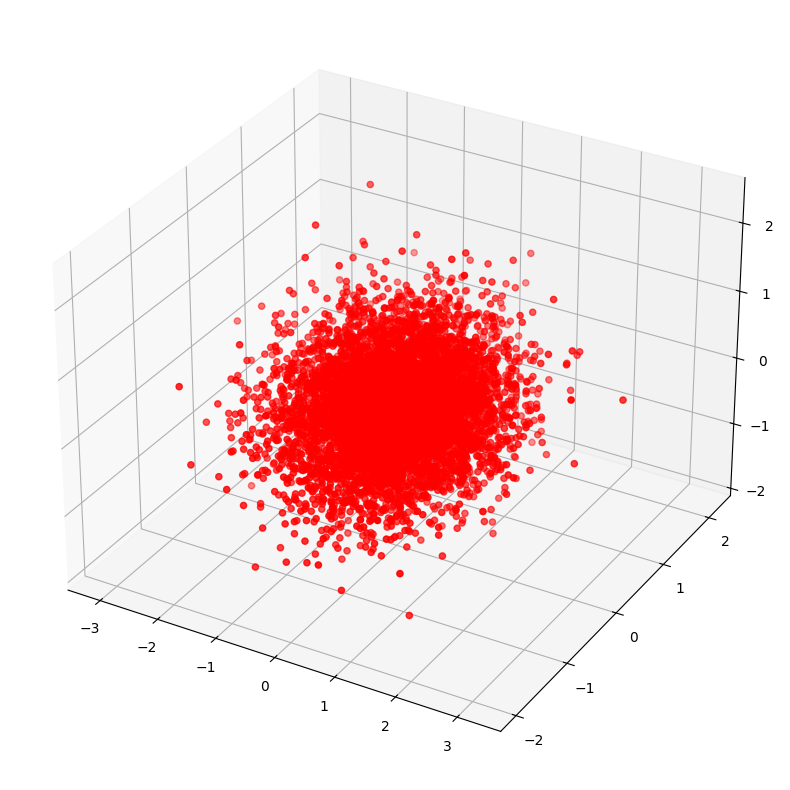

In [13]:
from sklearn.decomposition import PCA


pca_dataset = FaceDataset(dataset_path + f"128_aligned/", current_transform)
pca_dataloader = DataLoader(pca_dataset, batch_size=32, shuffle=False)


features_list = []

celeb_features = {}

# with torch.no_grad():
#   for i, images in tqdm(enumerate(pca_dataloader)):
#     batch_start_index = i * pca_dataloader.batch_size
#     for j, image in enumerate(images):
#         img_index = batch_start_index + j
#         img_title = pca_dataset.image_files[img_index]
#         name = img_title.replace(".png", "").replace(f"128_", "").replace("-", " ")
#         image = image.to(device)
#         features, _ = current_model(image.unsqueeze(0))
#         celeb_features[name] = features.cpu().numpy()
#         features_list.append(features.cpu().numpy())
# features = np.concatenate(features_list)

# with open(models_path + 'celeb_features.pkl', 'wb') as fi:
#     pickle.dump(celeb_features, fi)


with open(models_path + 'celeb_features_300_128.pck', 'rb') as fi:
    celeb_features = pickle.load(fi)

features = np.array(list(celeb_features.values()))
features = features.reshape(features.shape[0], features.shape[2])


pca = PCA(n_components=features_nb)
features_pca = pca.fit_transform(features)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(features_pca[:, 0], features_pca[:, 1], features_pca[:, 2], c='r', marker='o')

In [14]:
def plot_feature(f):
  if not isinstance(f, torch.Tensor):
    f = torch.from_numpy(f).to(device)
  with torch.no_grad():
      reconstruction = current_model.get_reconstruction(f.to(device))
  reconstruction_image = reconstruction.squeeze(0).cpu().numpy().transpose(1, 2, 0)
  plt.imshow(reconstruction_image)
  plt.show()


def plot_two_features(f1, f2, t1="", t2=""):

  if not isinstance(f1, torch.Tensor):
    f1 = torch.from_numpy(f1).to(device)
  if not isinstance(f2, torch.Tensor):
    f2 = torch.from_numpy(f2).to(device)
  with torch.no_grad():
      reconstruction1 = current_model.get_reconstruction(f1.to(device))
      reconstruction2 = current_model.get_reconstruction(f2.to(device))

  reconstruction_image1 = reconstruction1.squeeze(0).cpu().numpy().transpose(1, 2, 0)
  reconstruction_image2 = reconstruction2.squeeze(0).cpu().numpy().transpose(1, 2, 0)

  fig, ax = plt.subplots(1, 2, figsize=(10, 5))
  ax[0].imshow(reconstruction_image1)
  ax[0].set_title(t1)
  ax[0].axis("off")
  ax[1].imshow(reconstruction_image2)
  ax[1].set_title(t2)
  ax[1].axis("off")
  plt.show()


## Testing

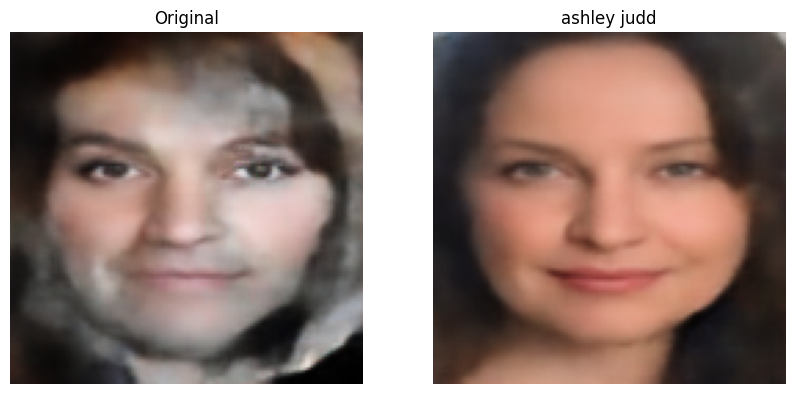

In [15]:
mean_feature = np.mean(features, axis=0)
covariance_matrix_features = np.cov(features, rowvar=False)

def sample_feature():
    return torch.from_numpy(np.random.multivariate_normal(mean_feature, covariance_matrix_features).astype(np.float32)).to(device).unsqueeze(0)
    # simply return the mean feature of the dataset
    # return torch.from_numpy(mean_feature).to(device).unsqueeze(0)
    # return random feature_nb dimensional vector between 0 and 1 (for testing purposes if pca not available)
    # return torch.rand(features_nb).to(device).unsqueeze(0)


def find_closest_celeb(feature):
    if feature.dtype == torch.float32:
      feature = feature.cpu()
    min_dist = float('inf')
    closest_celeb = None
    closest_celeb_feature = None
    for name, celeb_feature in celeb_features.items():
        distance = np.linalg.norm(feature - celeb_feature)
        if distance < min_dist:
            min_dist = distance
            closest_celeb = name
            closest_celeb_feature = celeb_feature
    return closest_celeb, min_dist, closest_celeb_feature




f = sample_feature()
cf = find_closest_celeb(f)

plot_two_features(f, cf[2], "Original", cf[0])
# plot_feature(f)

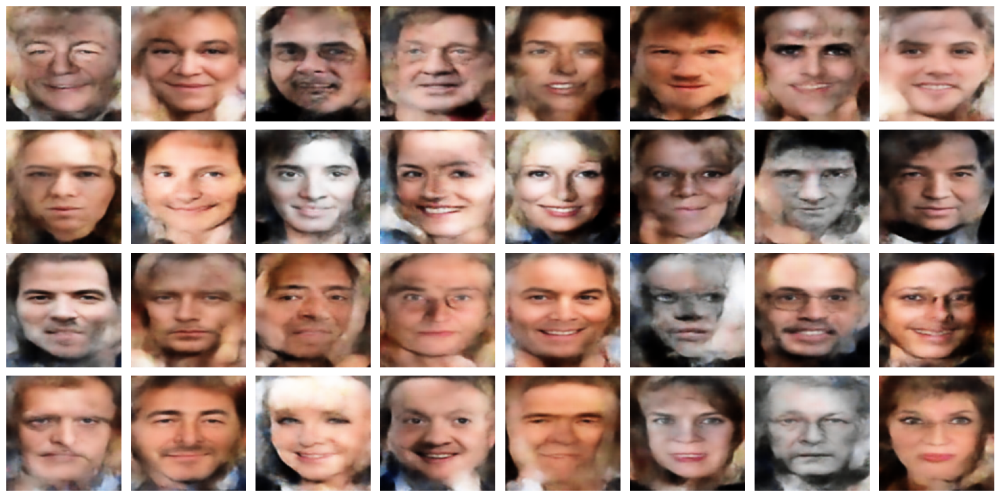

In [70]:
sampled_features = [sample_feature() for _ in range(32)]

reconstructed_images = []
with torch.no_grad():
    for feature in sampled_features:
        reconstructed_image = current_model.get_reconstruction(feature)
        reconstructed_images.append(reconstructed_image.squeeze(0).cpu().numpy().transpose(1, 2, 0))

fig, axes = plt.subplots(4, 8, figsize=(16, 8))
for i, ax in enumerate(axes.flat):
    ax.imshow(reconstructed_images[i])
    ax.axis('off')
plt.tight_layout()
plt.show()

In [71]:
def find_second_closest_celeb(feature):
    if feature.dtype == torch.float32:
      feature = feature.cpu()
    distances = []
    for name, celeb_feature in celeb_features.items():
        distance = np.linalg.norm(feature - celeb_feature)
        distances.append((name, distance, celeb_feature))

    distances.sort(key=lambda x: x[1])

    if len(distances) < 2:
        return None, float('inf'), None

    return distances[1][0], distances[1][1], distances[1][2]

torch.Size([1, 3, 128, 128])
jean michel dupuis


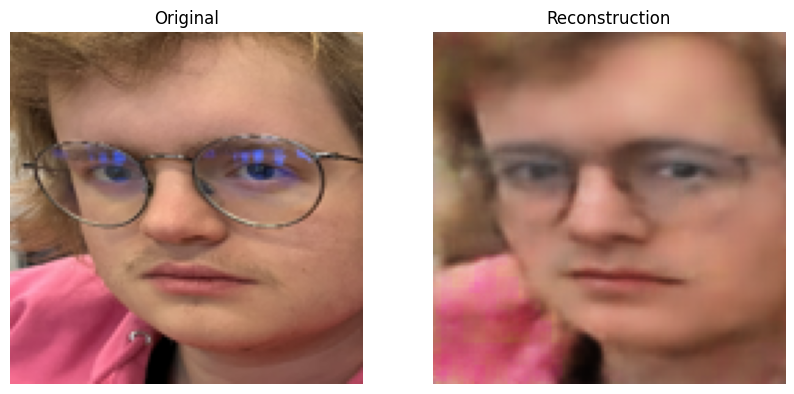

In [72]:
def compare_reconstruction(img_path):

  test_image = Image.open(img_path).convert('RGB')

  test_image_tensor = current_transform(test_image).unsqueeze(0).to(device)
  print(test_image_tensor.shape)


  with torch.no_grad():
      features, reconstruction = current_model(test_image_tensor)
      cf = find_second_closest_celeb(features)
      print(cf[0])

  reconstruction_image = reconstruction.squeeze(0).cpu().numpy().transpose(1, 2, 0)

  fig, ax = plt.subplots(1, 2, figsize=(10, 5))
  ax[0].imshow(test_image)
  ax[0].set_title("Original")
  ax[0].axis("off")
  ax[1].imshow(reconstruction_image)
  ax[1].set_title("Reconstruction")
  ax[1].axis("off")
  plt.show()


compare_reconstruction(dataset_path + f"{img_size}_aligned/images/{img_size}_martin-cuingnet.png")

In [ ]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display


mix_img1 = Image.open(dataset_path + f"{img_size}_aligned/{img_size}_martin-cuingnet.png").convert('RGB')
mix_img1_tensor = current_transform(mix_img1).unsqueeze(0).to(device)
mix_features1 = current_model.get_features(mix_img1_tensor)

mix_img2 = Image.open(dataset_path + f"{img_size}_aligned/{img_size}_feldup.png").convert('RGB')
mix_img2_tensor = current_transform(mix_img2).unsqueeze(0).to(device)
mix_features2 = current_model.get_features(mix_img2_tensor)

def mix_image(lerp=0.5):
  f = torch.lerp(mix_features1, mix_features2, lerp)
  plot_feature(f)
  print(find_closest_celeb(f.detach().cpu().numpy())[0])


lerp_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.01, description='Lerp factor')
ui = VBox([lerp_slider])
out = widgets.interactive_output(mix_image, {'lerp': lerp_slider})


display(ui, out)


Output()

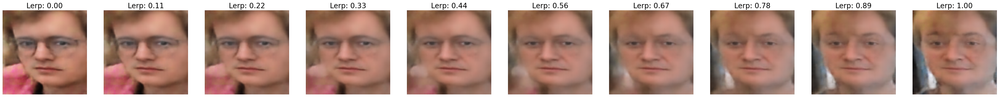

In [ ]:
import imageio

def save_mix_gif(title):
  frames = []
  for lerp in np.arange(0, 1.0, 0.01):
      f = torch.lerp(mix_features1, mix_features2, lerp)
      reconstruction = current_model.get_reconstruction(f.to(device))
      reconstruction_image = reconstruction.detach().squeeze(0).cpu().numpy().transpose(1, 2, 0)
      frames.append((reconstruction_image * 255).astype(np.uint8))

  imageio.mimsave(project_path + f'{title}.gif', frames, fps=20)


def show_mix_steps(title, steps=3):
  fig, ax = plt.subplots(1, steps, figsize=(steps*5, 5))
  for i in range(steps):
    lerp = i / (steps - 1)
    f = torch.lerp(mix_features1, mix_features2, lerp)
    reconstruction = current_model.get_reconstruction(f.to(device))
    reconstruction_image = reconstruction.detach().squeeze(0).cpu().numpy().transpose(1, 2, 0)
    ax[i].imshow(reconstruction_image)
    ax[i].axis("off")
    ax[i].set_title(f"Lerp: {lerp:.2f}")
    ax[i].title.set_fontsize(20)
  plt.show()

# save_mix_gif("barack_trump_mix")
# show_mix_steps("barack_trump_mix_steps", 10)

In [75]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display


edit_img = Image.open(dataset_path + f"{img_size}_aligned/images/{img_size}_jean-dujardin.png").convert('RGB')
edit_img_tensor = current_transform(edit_img).unsqueeze(0).to(device)
edit_features = current_model.get_features(edit_img_tensor)
edit_features_pca = pca.transform(edit_features.detach().cpu().numpy())

def edit_face(**dims):
  pca_features = edit_features_pca
  for i in dims:
    pca_features[0][int(i)] = dims[i]
  features = pca.inverse_transform(torch.from_numpy(pca_features))
  print(find_closest_celeb(features.detach().cpu().numpy())[0])
  with torch.no_grad():
      reconstruction = current_model.get_reconstruction(features)
  reconstruction_image = reconstruction.squeeze(0).cpu().numpy().transpose(1, 2, 0)
  plt.imshow(reconstruction_image)
  plt.show()


dim_sliders = [widgets.FloatSlider(value=edit_features_pca[0][i], min=-5.0, max=5.0, step=0.01, description=f'Dimension {i}') for i in range(10)]
ui = VBox(dim_sliders)
out = widgets.interactive_output(edit_face, {str(i) : d for i,d in enumerate(dim_sliders)})
display(ui, out)

Output()

### Analyse des différents sliders
0. Hair darkness
1. Side lighting / Face orientation
2. Age
3. Skin Color
4. Saturation (from yellow to black and white)
5. Age
6. Facial Pilosity (Hair and beard)
7. Saturation + Age
8. Face Orientation
9. Gender

# GAN


## Basic GAN

In [13]:
class Generator64(nn.Module):
    def __init__(self, latent_dim, img_channels=3):
        super(Generator64, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 1024, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, img_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        return self.model(x)

class Discriminator64(nn.Module):
    def __init__(self, img_channels=3):
        super(Discriminator64, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(img_channels, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
            nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2),
            nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.model(x)

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import transforms

def train_gan(data_path, latent_dim=100, batch_size=32, epochs=20, lr=1e-4, img_size=64, title=""):
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

    dataset = datasets.ImageFolder(root = dataset_path, transform = variable)
    loader = DataLoader(dataset, batch_size = batch_size, shuffle= True, drop_last=True)

    generator = Generator64(latent_dim).to(device)
    discriminator = Discriminator64().to(device)

    criterion = nn.BCELoss()
    optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for i, real_images in enumerate(tqdm(loader)):
            real_images = real_images.to(device)
            batch_size = real_images.size(0)

            real_labels = torch.ones(batch_size, 1).to(device)
            fake_labels = torch.zeros(batch_size, 1).to(device)

            optimizer_D.zero_grad()
            outputs = discriminator(real_images)
            outputs = outputs.view(-1, 1)
            d_loss_real = criterion(outputs, real_labels)
            d_loss_real.backward()

            z = torch.randn(batch_size, latent_dim, 1, 1).to(device)
            fake_images = generator(z)

            outputs = discriminator(fake_images.detach())
            outputs = outputs.view(-1, 1)
            d_loss_fake = criterion(outputs, fake_labels)
            d_loss_fake.backward()

            optimizer_D.step()
            d_loss = d_loss_real + d_loss_fake

            optimizer_G.zero_grad()
            outputs = discriminator(fake_images)
            outputs = outputs.view(-1, 1)
            g_loss = criterion(outputs, real_labels)
            g_loss.backward()
            optimizer_G.step()

            if (i + 1) % 100 == 0:
                print(f"Epoch [{epoch+1}/{epochs}], Step [{i+1}/{len(dataloader)}], d_loss: {d_loss.item():.4f}, g_loss: {g_loss.item():.4f}")

    torch.save(generator.state_dict(), models_path + f"generator_{img_size}_{latent_dim}_{epochs}_{lr}.pth")
    print(f"Saving the generator : generator_{img_size}_{latent_dim}_{epochs}_{lr}.pth")
    torch.save(discriminator.state_dict(), models_path + f"discriminator_{img_size}_{latent_dim}_{epochs}_{lr}.pth")
    print(f"Saving the discriminator : discriminator_{img_size}_{latent_dim}_{epochs}_{lr}.pth")

In [ ]:
# train_gan(dataset_path + "64_aligned/", img_size=64, latent_dim=100, epochs=5)

 50%|████▉     | 101/204 [01:14<00:09, 10.79it/s]

Epoch [1/5], Step [100/204], d_loss: 0.0682, g_loss: 20.3409


 99%|█████████▊| 201/204 [01:23<00:00, 10.71it/s]

Epoch [1/5], Step [200/204], d_loss: 0.4649, g_loss: 3.0646


 50%|█████     | 102/204 [00:09<00:09, 10.55it/s]

Epoch [2/5], Step [100/204], d_loss: 0.2448, g_loss: 4.9059


 99%|█████████▉| 202/204 [00:18<00:00, 10.66it/s]

Epoch [2/5], Step [200/204], d_loss: 0.3950, g_loss: 3.7619


 50%|█████     | 102/204 [00:09<00:09, 10.23it/s]

Epoch [3/5], Step [100/204], d_loss: 0.2104, g_loss: 4.2011


 99%|█████████▉| 202/204 [00:18<00:00, 10.76it/s]

Epoch [3/5], Step [200/204], d_loss: 1.2242, g_loss: 8.2020


 50%|████▉     | 101/204 [00:09<00:09, 10.87it/s]

Epoch [4/5], Step [100/204], d_loss: 1.5850, g_loss: 7.5007


 98%|█████████▊| 200/204 [00:19<00:00,  9.57it/s]

Epoch [4/5], Step [200/204], d_loss: 0.4457, g_loss: 5.3469


 49%|████▉     | 100/204 [00:09<00:09, 10.42it/s]

Epoch [5/5], Step [100/204], d_loss: 0.2068, g_loss: 3.4948


 98%|█████████▊| 200/204 [00:18<00:00, 10.55it/s]

Epoch [5/5], Step [200/204], d_loss: 0.2226, g_loss: 5.2285


100%|██████████| 204/204 [00:18<00:00, 10.74it/s]


Saving the generator : generator_64_100_5_0.0001.pth
Saving the discriminator : discriminator_64_100_5_0.0001.pth


<ipython-input-18-d203b0617a33>:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(models_path + "generator_64_300_30_0.0001.pth", map_lo

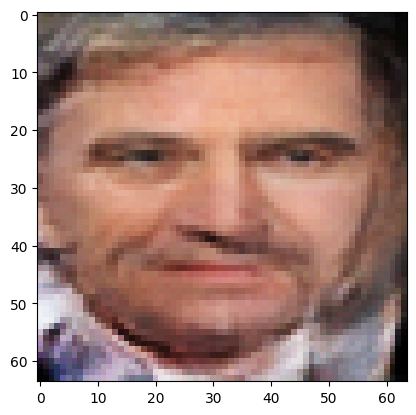

In [18]:
import torch
import matplotlib.pyplot as plt
import numpy as np

latent_dim = 300
z = torch.randn(1, latent_dim, 1, 1).to(device)

img_size = 64

current_transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

generator = Generator64(latent_dim).to(device)
generator.load_state_dict(torch.load(models_path + "generator_64_300_30_0.0001.pth", map_location=torch.device(device)))
generator.eval()


def plot_latent(z):
  with torch.no_grad():
      generated_image = generator(z)
      generated_image = (generated_image + 1) / 2.0


  generated_image = generated_image.squeeze(0).cpu().numpy().transpose(1, 2, 0)
  plt.imshow(generated_image)
  plt.show()

plot_latent(z)

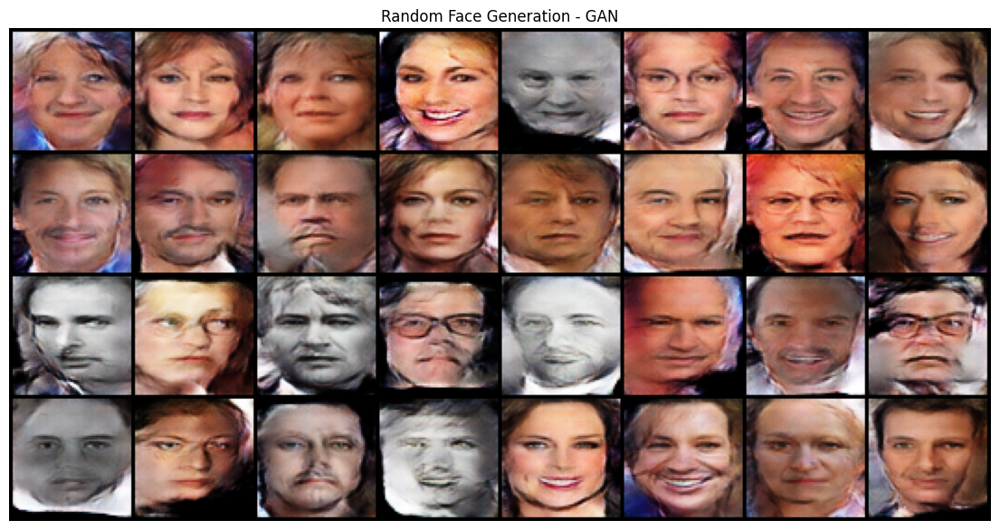

In [19]:
img_list = []
fixed_noise = torch.randn(32, latent_dim, 1, 1).to(device)
with torch.no_grad():
    fake = generator(fixed_noise).detach().cpu()
img_list.append(torchvision.utils.make_grid(fake, padding=2, normalize=True))
fig = plt.figure(figsize=(14,14))
plt.axis("off")
plt.title("Random Face Generation - GAN")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]

Iteration 0, Loss: 0.5105984210968018
Iteration 100, Loss: 0.0959395095705986
Iteration 200, Loss: 0.06908010691404343
Iteration 300, Loss: 0.05536951869726181
Iteration 400, Loss: 0.04591768980026245
Iteration 500, Loss: 0.04046054929494858
Iteration 600, Loss: 0.035064514726400375
Iteration 700, Loss: 0.032986633479595184
Iteration 800, Loss: 0.03161795064806938
Iteration 900, Loss: 0.030603840947151184
Iteration 1000, Loss: 0.0296633243560791
Iteration 1100, Loss: 0.02885734662413597
Iteration 1200, Loss: 0.02813166379928589
Iteration 1300, Loss: 0.02749222330749035
Iteration 1400, Loss: 0.026962272822856903
Iteration 1500, Loss: 0.02647768333554268
Iteration 1600, Loss: 0.02606794610619545
Iteration 1700, Loss: 0.025684967637062073
Iteration 1800, Loss: 0.025383539497852325
Iteration 1900, Loss: 0.025124650448560715
Iteration 2000, Loss: 0.024899175390601158
Iteration 2100, Loss: 0.02468719147145748
Iteration 2200, Loss: 0.024483397603034973
Iteration 2300, Loss: 0.0242843478918075

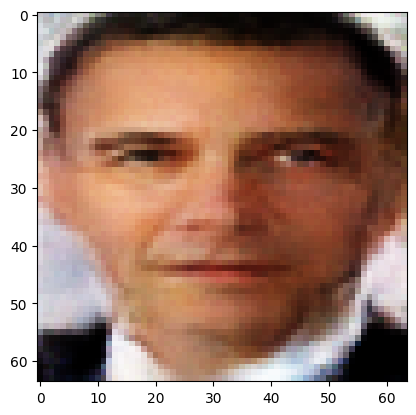

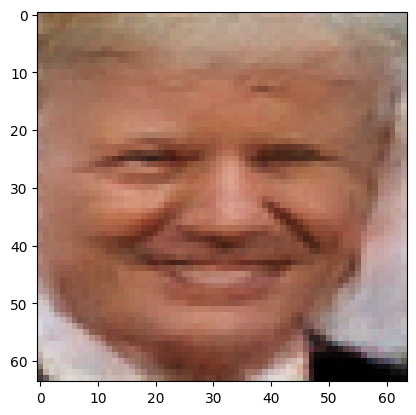

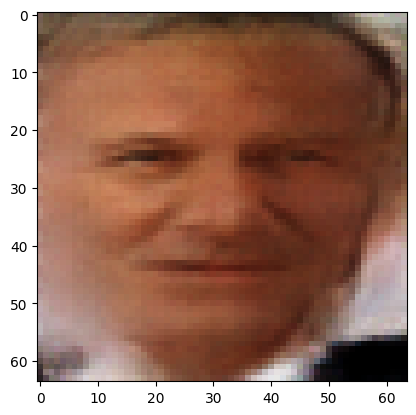

In [22]:
def invert_latent_space(image_path, iterations=3000, lr=0.01, log=True):
    img = Image.open(image_path).convert('RGB')
    img_tensor = current_transform(img).unsqueeze(0).to(device)

    z = torch.randn(1, latent_dim, 1, 1, requires_grad=True, device=device)
    optimizer = torch.optim.Adam([z], lr=lr)

    for i in range(iterations):
        optimizer.zero_grad()
        generated_image = generator(z)
        loss = nn.MSELoss()(generated_image, img_tensor)
        loss.backward()
        optimizer.step()

        if i % 100 == 0 and log:
          print(f"Iteration {i}, Loss: {loss.item()}")

    return z


latent_vector1 = invert_latent_space(dataset_path + f"64_aligned/images/64_barack-obama.png", iterations=10000, log=True)
latent_vector2 = invert_latent_space(dataset_path + f"64_aligned/images/64_donald-trump.png", iterations=10000, log=True)

plot_latent(latent_vector1)
plot_latent(latent_vector2)
plot_latent((latent_vector1 + latent_vector2)/2)

In [23]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display


z1 = invert_latent_space(dataset_path + f"64_aligned/images/64_barack-obama.png", log=False, iterations=10000)
z2 = invert_latent_space(dataset_path + f"64_aligned/images/64_donald-trump.png", log=False, iterations=10000)

def mix_image_GAN(lerp=0.5):
  z = torch.lerp(z1, z2, lerp)
  plot_latent(z)


lerp_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.01, description='Lerp factor')
ui = VBox([lerp_slider])
out = widgets.interactive_output(mix_image_GAN, {'lerp': lerp_slider})


display(ui, out)


Output()

In [24]:
import imageio

def show_mix_steps_gan(title, steps=3):
  fig, ax = plt.subplots(1, steps, figsize=(steps*5, 5))
  for i in range(steps):
    lerp = i / (steps - 1)
    f = torch.lerp(z1, z2, lerp)
    reconstruction = current_model.get_reconstruction(f.to(device))
    reconstruction_image = reconstruction.detach().squeeze(0).cpu().numpy().transpose(1, 2, 0)
    ax[i].imshow(reconstruction_image)
    ax[i].axis("off")
    ax[i].set_title(f"Lerp: {lerp:.2f}")
    ax[i].title.set_fontsize(20)
  plt.show()

show_mix_steps("barack_trump_mix_steps", 10)

NameError: name 'show_mix_steps' is not defined

In [ ]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display


z = latent_vector.detach()

def edit_face_gan(**dims):
  for i in dims:
    z[0][int(i)] = dims[i]
  plot_latent(z)


dim_sliders = [widgets.FloatSlider(value=z[0][i], min=-10.0, max=10.0, step=0.01, description=f'Dimension {i}') for i in range(10)]
ui = VBox(dim_sliders)
out = widgets.interactive_output(edit_face_gan, {str(i) : d for i,d in enumerate(dim_sliders)})
display(ui, out)

## WGAN GP


In [ ]:
learning_rate = 5e-5
batch_size = 128
image_size = 64
channel_img = 3
z_dim = 100
num_epochs = 20
feature_d = 64
feature_g = 64
critic_iterations = 5
lambda_GP = 10

variable = transforms.Compose(
    [
        transforms.Resize((image_size,image_size)),
        transforms.ToTensor(),
        transforms.Normalize(
        [0.5 for _ in range(channel_img)], [0.5 for _ in range(channel_img)]),])

In [ ]:
dataset = datasets.ImageFolder(root = dataset_path + "/64_aligned", transform = variable)
loader = DataLoader(dataset, batch_size = batch_size, shuffle= True, drop_last=True)

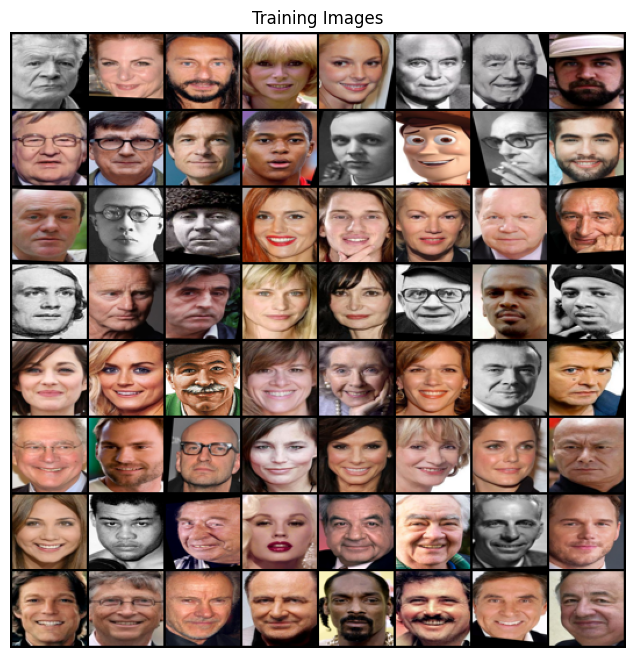

In [ ]:
real_batch = next(iter(loader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
class Critic(nn.Module):
    def __init__(self, channel_img, feature_d):
        super().__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(channel_img, feature_d, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            self._block(feature_d, feature_d*2, 4, 2, 1),
            self._block(feature_d*2, feature_d*4, 4, 2, 1),
            self._block(feature_d*4, feature_d*8, 4, 2, 1),
            nn.Conv2d(feature_d*8, 1, 4, 2, 0),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.InstanceNorm2d(out_channels, affine = True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        return self.disc(x)

In [ ]:
class Generator(nn.Module):
    def __init__(self, z_dim, channel_img, feature_g):
        super().__init__()
        self.gen = nn.Sequential(
            self._block(z_dim, feature_g*16, 4, 2, 0),
            self._block(feature_g*16, feature_g*8, 4, 2, 1),
            self._block(feature_g*8, feature_g*4, 4, 2, 1),
            self._block(feature_g*4, feature_g*2, 4, 2, 1),
            nn.ConvTranspose2d(feature_g*2, channel_img,4, 2, 1),
            nn.Tanh(),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x):
        return self.gen(x)

In [ ]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        if isinstance(m, nn.ConvTranspose2d):
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        if isinstance(m, nn.BatchNorm2d):
            nn.init.normal_(m.weight.data, 0.0,0.02)

In [ ]:
def gradient_penalty(critic, real, fake):
    batch_size, C, H, W = real.shape
    epsilon = torch.rand(batch_size,1,1,1).repeat(1,C,H,W).to(device)
    interpolated_images = real*epsilon + fake*(1-epsilon)

    mixed_scores = critic(interpolated_images)

    gradient = torch.autograd.grad(
        inputs = interpolated_images,
        outputs = mixed_scores,
        grad_outputs = torch.ones_like(mixed_scores),
        create_graph = True,
        retain_graph = True,
    )[0]

    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim = 1)
    gradient_penalty = torch.mean((gradient_norm - 1)**2)
    return gradient_penalty

In [ ]:
critic = Critic(channel_img, feature_d).to(device)
gen = Generator(z_dim, channel_img, feature_g).to(device)
initialize_weights(critic)
initialize_weights(gen)

opt_critic = optim.Adam(critic.parameters(), lr = learning_rate, betas=(0.0, 0.9))
opt_gen = optim.Adam(gen.parameters(), lr= learning_rate, betas=(0.0,0.9))

gen.train()
critic.train()

Critic(
  (disc): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (5): Conv2d(512, 1, kernel_size=(4, 4), stride=(2, 2))
  )
)

In [ ]:
# step = 0

# for epoch in range(num_epochs):
#     for batch_idx, (real, _) in enumerate(loader):
#         real = real.to(device)


#         for _ in range(critic_iterations):
#             noise = torch.randn(batch_size, z_dim, 1, 1).to(device)
#             fake = gen(noise)
#             critic_real = critic(real).reshape(-1)
#             critic_fake = critic(fake).reshape(-1)
#             gp = gradient_penalty(critic, real, fake)
#             loss_critic = -(torch.mean(critic_real) - torch.mean(critic_fake)) + lambda_GP*gp
#             critic.zero_grad()
#             loss_critic.backward(retain_graph = True)
#             opt_critic.step()

#         # Training Generator : -min E(critic(fgen_fake))
#         output = critic(fake).reshape(-1)
#         loss_gen = -torch.mean(output)
#         gen.zero_grad()
#         loss_gen.backward()
#         opt_gen.step()

#         if batch_idx % 100 ==0:
#             print(f"Epoch [{epoch+1}/{num_epochs}] Batch : {batch_idx}/{len(loader)} \
#             LossD: {loss_critic:.4f}, LossG: {loss_gen:.4f}"
#                  )

#         step += 1

Epoch [1/20] Batch : 0/50             LossD: -12.5657, LossG: 45.6217
Epoch [2/20] Batch : 0/50             LossD: -10.9219, LossG: 45.0186
Epoch [3/20] Batch : 0/50             LossD: -12.0690, LossG: 43.9880
Epoch [4/20] Batch : 0/50             LossD: -13.5544, LossG: 48.5169
Epoch [5/20] Batch : 0/50             LossD: -12.6434, LossG: 46.9936
Epoch [6/20] Batch : 0/50             LossD: -13.7795, LossG: 49.4415
Epoch [7/20] Batch : 0/50             LossD: -11.5440, LossG: 43.3700
Epoch [8/20] Batch : 0/50             LossD: -13.9442, LossG: 44.1063
Epoch [9/20] Batch : 0/50             LossD: -11.9463, LossG: 47.3852
Epoch [10/20] Batch : 0/50             LossD: -13.2508, LossG: 47.6091
Epoch [11/20] Batch : 0/50             LossD: -12.2431, LossG: 48.6302
Epoch [12/20] Batch : 0/50             LossD: -13.0225, LossG: 50.3523
Epoch [13/20] Batch : 0/50             LossD: -10.9371, LossG: 46.6473
Epoch [14/20] Batch : 0/50             LossD: -11.0394, LossG: 48.6159
Epoch [15/20] B

In [ ]:
# torch.save(gen.state_dict(), models_path + "wgangp_gen_new_40.h5")
# torch.save(critic.state_dict(), models_path + "wgangp_crit_new_40.h5")

In [ ]:
gen = Generator(z_dim, channel_img, feature_g).to(device)
gen.load_state_dict(torch.load(models_path + "wgangp_gen_new_40.h5", map_location='cuda'))
gen.cuda()

<ipython-input-18-414baa2ad50c>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  gen.load_state_dict(torch.load(models_path + "wgangp_gen_new_40.h5", map_location='cuda'))


Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(2, 2))
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (4): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1

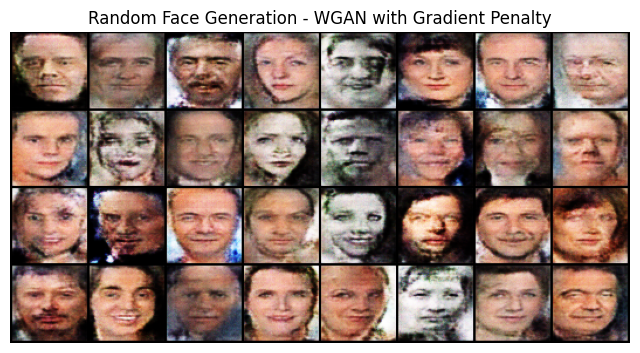

In [ ]:
img_list = []
fixed_noise = torch.randn(32, z_dim, 1, 1).to(device)
with torch.no_grad():
    fake = gen(fixed_noise).detach().cpu()
img_list.append(torchvision.utils.make_grid(fake, padding=2, normalize=True))
fig = plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Random Face Generation - WGAN with Gradient Penalty")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]

Iteration 0, Loss: 0.2566002607345581
Iteration 100, Loss: 0.06172313541173935
Iteration 200, Loss: 0.056692998856306076
Iteration 300, Loss: 0.05605904757976532
Iteration 400, Loss: 0.055958718061447144
Iteration 500, Loss: 0.05593235418200493
Iteration 600, Loss: 0.05594177544116974
Iteration 700, Loss: 0.05594732612371445
Iteration 800, Loss: 0.05594736337661743
Iteration 900, Loss: 0.05596201866865158
Iteration 1000, Loss: 0.05593438073992729
Iteration 1100, Loss: 0.05596238374710083
Iteration 1200, Loss: 0.055943332612514496
Iteration 1300, Loss: 0.05605082958936691
Iteration 1400, Loss: 0.055932700634002686
Iteration 0, Loss: 0.23558568954467773
Iteration 100, Loss: 0.05969744175672531
Iteration 200, Loss: 0.0534881167113781
Iteration 300, Loss: 0.051063697785139084
Iteration 400, Loss: 0.05081726238131523
Iteration 500, Loss: 0.050750311464071274
Iteration 600, Loss: 0.05067551136016846
Iteration 700, Loss: 0.05063260719180107
Iteration 800, Loss: 0.05058467015624046
Iteration 9

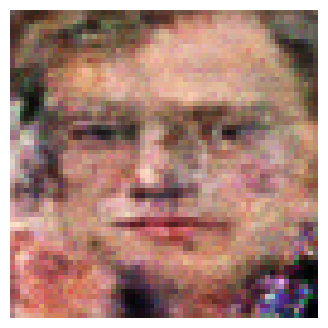

In [ ]:
# Latent space inversion

latent_vectors = []
for _ in range(20):
    latent_vectors.append(torch.randn(1, z_dim, 1, 1, device=device))

best_latent_vector = None
min_loss = float('inf')

for z in latent_vectors:
    z.requires_grad = True
    optimizer = torch.optim.Adam([z], lr=0.1)

    img = Image.open(dataset_path + f"64_aligned/images/64_martin-cuingnet.png").convert('RGB')
    img_tensor = variable(img).unsqueeze(0).to(device)

    for i in range(1500):
        optimizer.zero_grad()
        generated_image = gen(z)
        loss = nn.MSELoss()(generated_image, img_tensor)
        loss.backward()
        optimizer.step()
        if i % 100 == 0 :
          print(f"Iteration {i}, Loss: {loss.item()}")

    if loss.item() < min_loss:
        min_loss = loss.item()
        best_latent_vector = z

img_list = []
with torch.no_grad():
    fake = gen(best_latent_vector).detach().cpu()
img_list.append(torchvision.utils.make_grid(fake, padding=2, normalize=True))
fig = plt.figure(figsize=(4,4))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]

## Progressive scaling (see https://github.com/odegeasslbc/Progressive-GAN-pytorch)


In [ ]:
import torch
from torch import nn
from torch.nn import functional as F

from math import sqrt


class EqualLR:
    def __init__(self, name):
        self.name = name

    def compute_weight(self, module):
        weight = getattr(module, self.name + '_orig')
        fan_in = weight.data.size(1) * weight.data[0][0].numel()

        return weight * sqrt(2 / fan_in)

    @staticmethod
    def apply(module, name):
        fn = EqualLR(name)

        weight = getattr(module, name)
        del module._parameters[name]
        module.register_parameter(name + '_orig', nn.Parameter(weight.data))
        module.register_forward_pre_hook(fn)

        return fn

    def __call__(self, module, input):
        weight = self.compute_weight(module)
        setattr(module, self.name, weight)


def equal_lr(module, name='weight'):
    EqualLR.apply(module, name)

    return module


class PixelNorm(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, input):
        return input / torch.sqrt(torch.mean(input ** 2, dim=1, keepdim=True)
                                  + 1e-8)


class EqualConv2d(nn.Module):
    def __init__(self, *args, **kwargs):
        super().__init__()

        conv = nn.Conv2d(*args, **kwargs)
        conv.weight.data.normal_()
        conv.bias.data.zero_()
        self.conv = equal_lr(conv)

    def forward(self, input):
        return self.conv(input)


class EqualConvTranspose2d(nn.Module):
    def __init__(self, *args, **kwargs):
        super().__init__()

        conv = nn.ConvTranspose2d(*args, **kwargs)
        conv.weight.data.normal_()
        conv.bias.data.zero_()
        self.conv = equal_lr(conv)

    def forward(self, input):
        return self.conv(input)

class EqualLinear(nn.Module):
    def __init__(self, in_dim, out_dim):
        super().__init__()

        linear = nn.Linear(in_dim, out_dim)
        linear.weight.data.normal_()
        linear.bias.data.zero_()

        self.linear = equal_lr(linear)

    def forward(self, input):
        return self.linear(input)


class ConvBlock(nn.Module):
    def __init__(self, in_channel, out_channel, kernel_size, padding, kernel_size2=None, padding2=None, pixel_norm=True):
        super().__init__()

        pad1 = padding
        pad2 = padding
        if padding2 is not None:
            pad2 = padding2

        kernel1 = kernel_size
        kernel2 = kernel_size
        if kernel_size2 is not None:
            kernel2 = kernel_size2

        convs = [EqualConv2d(in_channel, out_channel, kernel1, padding=pad1)]
        if pixel_norm:
            convs.append(PixelNorm())
        convs.append(nn.LeakyReLU(0.1))
        convs.append(EqualConv2d(out_channel, out_channel, kernel2, padding=pad2))
        if pixel_norm:
            convs.append(PixelNorm())
        convs.append(nn.LeakyReLU(0.1))

        self.conv = nn.Sequential(*convs)

    def forward(self, input):
        out = self.conv(input)
        return out


def upscale(feat):
    return F.interpolate(feat, scale_factor=2, mode='bilinear', align_corners=False)

class Generator(nn.Module):
    def __init__(self, input_code_dim=128, in_channel=128, pixel_norm=True, tanh=True):
        super().__init__()
        self.input_dim = input_code_dim
        self.tanh = tanh
        self.input_layer = nn.Sequential(
            EqualConvTranspose2d(input_code_dim, in_channel, 4, 1, 0),
            PixelNorm(),
            nn.LeakyReLU(0.1))

        self.progression_4 = ConvBlock(in_channel, in_channel, 3, 1, pixel_norm=pixel_norm)
        self.progression_8 = ConvBlock(in_channel, in_channel, 3, 1, pixel_norm=pixel_norm)
        self.progression_16 = ConvBlock(in_channel, in_channel, 3, 1, pixel_norm=pixel_norm)
        self.progression_32 = ConvBlock(in_channel, in_channel, 3, 1, pixel_norm=pixel_norm)
        self.progression_64 = ConvBlock(in_channel, in_channel//2, 3, 1, pixel_norm=pixel_norm)
        self.progression_128 = ConvBlock(in_channel//2, in_channel//4, 3, 1, pixel_norm=pixel_norm)
        self.progression_256 = ConvBlock(in_channel//4, in_channel//4, 3, 1, pixel_norm=pixel_norm)

        self.to_rgb_8 = EqualConv2d(in_channel, 3, 1)
        self.to_rgb_16 = EqualConv2d(in_channel, 3, 1)
        self.to_rgb_32 = EqualConv2d(in_channel, 3, 1)
        self.to_rgb_64 = EqualConv2d(in_channel//2, 3, 1)
        self.to_rgb_128 = EqualConv2d(in_channel//4, 3, 1)
        self.to_rgb_256 = EqualConv2d(in_channel//4, 3, 1)

        self.max_step = 6

    def progress(self, feat, module):
        out = F.interpolate(feat, scale_factor=2, mode='bilinear', align_corners=False)
        out = module(out)
        return out

    def output(self, feat1, feat2, module1, module2, alpha):
        if 0 <= alpha < 1:
            skip_rgb = upscale(module1(feat1))
            out = (1-alpha)*skip_rgb + alpha*module2(feat2)
        else:
            out = module2(feat2)
        if self.tanh:
            return torch.tanh(out)
        return out

    def forward(self, input, step=0, alpha=-1):
        if step > self.max_step:
            step = self.max_step

        out_4 = self.input_layer(input.view(-1, self.input_dim, 1, 1))
        out_4 = self.progression_4(out_4)
        out_8 = self.progress(out_4, self.progression_8)
        if step==1:
            if self.tanh:
                return torch.tanh(self.to_rgb_8(out_8))
            return self.to_rgb_8(out_8)

        out_16 = self.progress(out_8, self.progression_16)
        if step==2:
            return self.output( out_8, out_16, self.to_rgb_8, self.to_rgb_16, alpha )

        out_32 = self.progress(out_16, self.progression_32)
        if step==3:
            return self.output( out_16, out_32, self.to_rgb_16, self.to_rgb_32, alpha )

        out_64 = self.progress(out_32, self.progression_64)
        if step==4:
            return self.output( out_32, out_64, self.to_rgb_32, self.to_rgb_64, alpha )

        out_128 = self.progress(out_64, self.progression_128)
        if step==5:
            return self.output( out_64, out_128, self.to_rgb_64, self.to_rgb_128, alpha )

        out_256 = self.progress(out_128, self.progression_256)
        if step==6:
            return self.output( out_128, out_256, self.to_rgb_128, self.to_rgb_256, alpha )


class Discriminator(nn.Module):
    def __init__(self, feat_dim=128):
        super().__init__()

        self.progression = nn.ModuleList([ConvBlock(feat_dim//4, feat_dim//4, 3, 1),
                                          ConvBlock(feat_dim//4, feat_dim//2, 3, 1),
                                          ConvBlock(feat_dim//2, feat_dim, 3, 1),
                                          ConvBlock(feat_dim, feat_dim, 3, 1),
                                          ConvBlock(feat_dim, feat_dim, 3, 1),
                                          ConvBlock(feat_dim, feat_dim, 3, 1),
                                          ConvBlock(feat_dim+1, feat_dim, 3, 1, 4, 0)])

        self.from_rgb = nn.ModuleList([EqualConv2d(3, feat_dim//4, 1),
                                       EqualConv2d(3, feat_dim//4, 1),
                                       EqualConv2d(3, feat_dim//2, 1),
                                       EqualConv2d(3, feat_dim, 1),
                                       EqualConv2d(3, feat_dim, 1),
                                       EqualConv2d(3, feat_dim, 1),
                                       EqualConv2d(3, feat_dim, 1)])

        self.n_layer = len(self.progression)

        self.linear = EqualLinear(feat_dim, 1)

    def forward(self, input, step=0, alpha=-1):
        for i in range(step, -1, -1):
            index = self.n_layer - i - 1

            if i == step:
                out = self.from_rgb[index](input)

            if i == 0:
                out_std = torch.sqrt(out.var(0, unbiased=False) + 1e-8)
                mean_std = out_std.mean()
                mean_std = mean_std.expand(out.size(0), 1, 4, 4)
                out = torch.cat([out, mean_std], 1)

            out = self.progression[index](out)

            if i > 0:
                # out = F.avg_pool2d(out, 2)
                out = F.interpolate(out, scale_factor=0.5, mode='bilinear', align_corners=False)

                if i == step and 0 <= alpha < 1:
                    # skip_rgb = F.avg_pool2d(input, 2)
                    skip_rgb = F.interpolate(input, scale_factor=0.5, mode='bilinear', align_corners=False)
                    skip_rgb = self.from_rgb[index + 1](skip_rgb)
                    out = (1 - alpha) * skip_rgb + alpha * out

        out = out.squeeze(2).squeeze(2)
        # print(input.size(), out.size(), step)
        out = self.linear(out)

        return out

In [ ]:
from tqdm import tqdm
import numpy as np
from PIL import Image
import argparse
import random

import torch
import torch.nn.functional as F
from torch import nn, optim
from torch.autograd import Variable, grad
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, utils


def accumulate(model1, model2, decay=0.999):
    par1 = dict(model1.named_parameters())
    par2 = dict(model2.named_parameters())

    for k in par1.keys():
        par1[k].data.mul_(decay).add_(1 - decay, par2[k].data)


def imagefolder_loader(path):
    def loader(transform):
        data = datasets.ImageFolder(path, transform=transform)
        data_loader = DataLoader(data, shuffle=True, batch_size=batch_size,
                                 num_workers=4)
        return data_loader
    return loader


def sample_data(dataloader, image_size=4):
    transform = transforms.Compose([
        transforms.Resize(image_size+int(image_size*0.2)+1),
        transforms.RandomCrop(image_size),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

    loader = dataloader(transform)

    return loader


def train(generator, discriminator, init_step, loader, total_iter=600000):
    step = init_step # can be 1 = 8, 2 = 16, 3 = 32, 4 = 64, 5 = 128, 6 = 128
    data_loader = sample_data(loader, 4 * 2 ** step)
    dataset = iter(data_loader)

    #total_iter = 600000
    total_iter_remain = total_iter - (total_iter//5)*(step-1)

    # pbar = tqdm(range(total_iter_remain))

    disc_loss_val = 0
    gen_loss_val = 0
    grad_loss_val = 0

    alpha = 0
    #one = torch.FloatTensor([1]).to(device)
    one = torch.tensor(1, dtype=torch.float).to(device)
    mone = one * -1
    iteration = 0

    for i in range(total_iter_remain):
        discriminator.zero_grad()

        alpha = min(1, (2/(total_iter//5)) * iteration)

        if iteration > total_iter//5:
            alpha = 0
            iteration = 0
            step += 1

            if step > 5:
                alpha = 1
                step = 5
            data_loader = sample_data(loader, 4 * 2 ** step)
            dataset = iter(data_loader)

        try:
            real_image, label = next(dataset)

        except (OSError, StopIteration):
            dataset = iter(data_loader)
            real_image, label = next(dataset)

        iteration += 1

        ### 1. train Discriminator
        b_size = real_image.size(0)
        real_image = real_image.to(device)
        label = label.to(device)
        real_predict = discriminator(
            real_image, step=step, alpha=alpha)
        real_predict = real_predict.mean() \
            - 0.001 * (real_predict ** 2).mean()
        real_predict.backward(mone)

        # sample input data: vector for Generator
        gen_z = torch.randn(b_size, input_code_size).to(device)

        fake_image = generator(gen_z, step=step, alpha=alpha)
        fake_predict = discriminator(
            fake_image.detach(), step=step, alpha=alpha)
        fake_predict = fake_predict.mean()
        fake_predict.backward(one)

        ### gradient penalty for D
        eps = torch.rand(b_size, 1, 1, 1).to(device)
        x_hat = eps * real_image.data + (1 - eps) * fake_image.detach().data
        x_hat.requires_grad = True
        hat_predict = discriminator(x_hat, step=step, alpha=alpha)
        grad_x_hat = grad(
            outputs=hat_predict.sum(), inputs=x_hat, create_graph=True)[0]
        grad_penalty = ((grad_x_hat.view(grad_x_hat.size(0), -1)
                         .norm(2, dim=1) - 1)**2).mean()
        grad_penalty = 10 * grad_penalty
        grad_penalty.backward()
        grad_loss_val += grad_penalty.item()
        disc_loss_val += (real_predict - fake_predict).item()

        d_optimizer.step()

        ### 2. train Generator
        if (i + 1) % n_critic == 0:
            generator.zero_grad()
            discriminator.zero_grad()

            predict = discriminator(fake_image, step=step, alpha=alpha)

            loss = -predict.mean()
            gen_loss_val += loss.item()


            loss.backward()
            g_optimizer.step()
            accumulate(g_running, generator)

        if (i+1)%200 == 0:
            state_msg = (f'{i + 1}; G: {gen_loss_val/(200//n_critic):.3f}; D: {disc_loss_val/200:.3f};'
                f' Grad: {grad_loss_val/200:.3f}; Alpha: {alpha:.3f}')


            disc_loss_val = 0
            gen_loss_val = 0
            grad_loss_val = 0

            print(state_msg)
            #pbar.set_description(state_msg)


trial_name = "testing"
input_code_size = 100
batch_size = 4
n_critic = 1

generator = Generator(in_channel=128, input_code_dim=input_code_size, pixel_norm=False, tanh=False).to(device)
discriminator = Discriminator(feat_dim=128).to(device)
g_running = Generator(in_channel=128, input_code_dim=input_code_size, pixel_norm=False, tanh=False).to(device)

## you can directly load a pretrained model here
#generator.load_state_dict(torch.load('./tr checkpoint/150000_g.model'))
#g_running.load_state_dict(torch.load('checkpoint/150000_g.model'))
#discriminator.load_state_dict(torch.load('checkpoint/150000_d.model'))

g_running.train(False)

g_optimizer = optim.Adam(generator.parameters(), lr=0.01, betas=(0.0, 0.99))
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.01, betas=(0.0, 0.99))

accumulate(g_running, generator, 0)

loader = imagefolder_loader(dataset_path + "128_aligned")

train(generator, discriminator, 1, loader, 5000)


200; G: -2.906; D: 0.034; Grad: 0.662; Alpha: 0.398
400; G: -0.643; D: 0.037; Grad: 0.507; Alpha: 0.798
600; G: 0.685; D: -0.043; Grad: 0.523; Alpha: 1.000
800; G: 0.648; D: -0.002; Grad: 0.421; Alpha: 1.000
1000; G: 0.824; D: 0.040; Grad: 0.386; Alpha: 1.000
1200; G: 2.505; D: 0.396; Grad: 0.576; Alpha: 0.396
1400; G: 1.858; D: 0.320; Grad: 0.468; Alpha: 0.796
1600; G: 2.071; D: 0.367; Grad: 0.743; Alpha: 1.000
1800; G: 1.568; D: 0.114; Grad: 0.607; Alpha: 1.000
2000; G: 1.425; D: 0.075; Grad: 0.497; Alpha: 1.000
2200; G: 3.803; D: 0.670; Grad: 0.731; Alpha: 0.394
2400; G: 4.110; D: 1.054; Grad: 0.686; Alpha: 0.794
2600; G: 3.656; D: 0.854; Grad: 0.991; Alpha: 1.000
2800; G: 3.755; D: 0.649; Grad: 0.807; Alpha: 1.000
3000; G: 2.479; D: 0.342; Grad: 0.730; Alpha: 1.000
3200; G: 5.503; D: 2.146; Grad: 1.987; Alpha: 0.392
3400; G: 8.132; D: 2.426; Grad: 0.986; Alpha: 0.792
3600; G: 3.702; D: 1.889; Grad: 5.552; Alpha: 1.000
3800; G: -17.112; D: -0.395; Grad: 9.824; Alpha: 1.000
4000; G: 

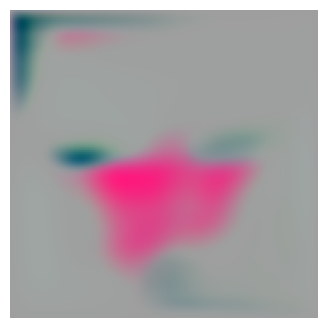

In [ ]:
z = torch.randn(1, z_dim, 1, 1).to(device)

# Generate the image from the latent vector
with torch.no_grad():
    generated_image = generator(z, step=5, alpha=1).detach().cpu()

# Display the image
plt.figure(figsize=(4, 4))
plt.imshow(np.transpose(torchvision.utils.make_grid(generated_image, padding=2, normalize=True), (1, 2, 0)))
plt.axis('off')
plt.show()

# VAE

In [3]:
import torch
import torch.nn as nn

class VEncoder64(nn.Module):
    def __init__(self, latent_dim):
        super(VEncoder64, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(256 * 8 * 8, 2 * latent_dim) # Output mu and logvar
        )

    def forward(self, x):
        h = self.encoder(x)
        mu, logvar = torch.chunk(h, 2, dim=1)
        return mu, logvar

class VDecoder64(nn.Module):
    def __init__(self, latent_dim):
        super(VDecoder64, self).__init__()
        self.fc = nn.Linear(latent_dim, 256 * 8 * 8)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def forward(self, z):
        x = self.fc(z)
        x = x.view(x.size(0), 256, 8, 8)
        return self.decoder(x)

class VAE64(nn.Module):
    def __init__(self, latent_dim):
        super(VAE64, self).__init__()
        self.encoder = VEncoder64(latent_dim)
        self.decoder = VDecoder64(latent_dim)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        recon_x = self.decoder(z)
        return recon_x, mu, logvar

In [26]:
class VEncoder128(nn.Module):
    def __init__(self, latent_dim):
        super(VEncoder128, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(1024 * 8 * 8, 2 * latent_dim)
        )

    def forward(self, x):
        h = self.encoder(x)
        mu, logvar = torch.chunk(h, 2, dim=1)
        return mu, logvar

class VDecoder128(nn.Module):
    def __init__(self, latent_dim):
        super(VDecoder128, self).__init__()
        self.fc = nn.Linear(latent_dim, 1024 * 8 * 8)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 3, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def forward(self, z):
        x = self.fc(z)
        x = x.view(x.size(0), 1024, 8, 8)
        return self.decoder(x)

class VAE128(nn.Module):
    def __init__(self, latent_dim):
        super(VAE128, self).__init__()
        self.encoder = VEncoder128(latent_dim)
        self.decoder = VDecoder128(latent_dim)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std

    def encode(self, x):
        mu, logvar = self.encoder(x)
        return mu, logvar

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon_x = self.decode(z)
        return recon_x, mu, logvar

In [5]:
def vae_loss(x, x_hat, mean, log_var):
    reproduction_loss = nn.functional.binary_cross_entropy(x_hat, x, reduction='sum')
    KLD = - 0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp())

    return reproduction_loss + KLD

def train_vae(data_path, feature_dim=100, batch_size=32, epochs=20, lr=1e-3, title="", img_size=64):
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
    ])

    dataset = FaceDataset(data_path, transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    model = VAE128(feature_dim).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        for images in tqdm(dataloader):
            images = images.to(device)
            optimizer.zero_grad()
            reconstructions, mu, logvar = model(images)


            loss = vae_loss(images, reconstructions, mu, logvar)

            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
        print(f"Epoch {epoch+1}/{epochs}, Loss: {epoch_loss/len(dataloader)}")
    model_name = f"{title}_{os.path.basename(os.path.normpath(data_path))}_vae_{feature_dim}_{epochs}_{lr}_{batch_size}.pth"
    torch.save(model.state_dict(), models_path + model_name)
    print(f"Training complete, model saved : {model_name}")

In [ ]:
# train_vae(dataset_path + "128_aligned/images", title="first_draft_basic",feature_dim=300,epochs=20,batch_size=32, img_size=128)

100%|██████████| 204/204 [03:35<00:00,  1.05s/it]


Epoch 1/20, Loss: 974410.71875


100%|██████████| 204/204 [01:07<00:00,  3.01it/s]


Epoch 2/20, Loss: 910689.7317708334


100%|██████████| 204/204 [01:07<00:00,  3.03it/s]


Epoch 3/20, Loss: 898785.0398284313


100%|██████████| 204/204 [01:07<00:00,  3.03it/s]


Epoch 4/20, Loss: 892321.228247549


100%|██████████| 204/204 [01:07<00:00,  3.04it/s]


Epoch 5/20, Loss: 887599.7291666666


100%|██████████| 204/204 [01:07<00:00,  3.03it/s]


Epoch 6/20, Loss: 884286.6145833334


100%|██████████| 204/204 [01:07<00:00,  3.04it/s]


Epoch 7/20, Loss: 882334.4987745098


100%|██████████| 204/204 [01:07<00:00,  3.04it/s]


Epoch 8/20, Loss: 880389.9649203431


100%|██████████| 204/204 [01:07<00:00,  3.04it/s]


Epoch 9/20, Loss: 878399.4528186275


100%|██████████| 204/204 [01:07<00:00,  3.03it/s]


Epoch 10/20, Loss: 876940.8345588235


100%|██████████| 204/204 [01:07<00:00,  3.04it/s]


Epoch 11/20, Loss: 876330.4114583334


100%|██████████| 204/204 [01:07<00:00,  3.04it/s]


Epoch 12/20, Loss: 874596.1248468137


100%|██████████| 204/204 [01:06<00:00,  3.05it/s]


Epoch 13/20, Loss: 873906.0367647059


100%|██████████| 204/204 [01:06<00:00,  3.05it/s]


Epoch 14/20, Loss: 873181.4083946078


100%|██████████| 204/204 [01:06<00:00,  3.05it/s]


Epoch 15/20, Loss: 871992.5949754902


100%|██████████| 204/204 [01:07<00:00,  3.04it/s]


Epoch 16/20, Loss: 871630.5836397059


100%|██████████| 204/204 [01:07<00:00,  3.04it/s]


Epoch 17/20, Loss: 870722.2682291666


100%|██████████| 204/204 [01:06<00:00,  3.06it/s]


Epoch 18/20, Loss: 870140.9329044118


100%|██████████| 204/204 [01:06<00:00,  3.05it/s]


Epoch 19/20, Loss: 869969.0952818628


100%|██████████| 204/204 [01:07<00:00,  3.04it/s]


Epoch 20/20, Loss: 868886.4257046569
Training complete, model saved : first_draft_basic_images_vae_300_20_0.001_32.pth


In [76]:
img_size = 128
features_nb = 300
model = VAE128(300).to(device)
model.load_state_dict(torch.load(models_path + "first_draft_basic_images_vae_300_20_0.001_32.pth", map_location=torch.device(device)))
# model.eval()

current_transform = transforms.Compose([
      transforms.Resize((img_size, img_size)),
      transforms.ToTensor(),
  ])

<ipython-input-76-c3e580f10888>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(models_path + "first_draft_basic_images_vae_300_20_0.001_32

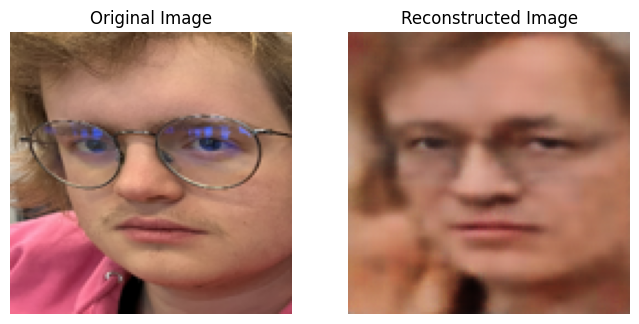

In [77]:

example_img_path = dataset_path + f"{img_size}_aligned/images/{img_size}_martin-cuingnet.png"
# open example image from datapath
example_image = Image.open(example_img_path)
example_image = current_transform(example_image)
example_image = example_image.unsqueeze(0).to(device)


with torch.no_grad():
    reconstructed_image, mu, logvar = model(example_image)
    reconstructed_image = reconstructed_image.detach().cpu()
    # print(mu)


# Display the original and reconstructed images
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(np.transpose(example_image.squeeze(0).cpu(), (1, 2, 0)))  # Adjust for image format if needed
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Reconstructed Image")
plt.imshow(np.transpose(reconstructed_image.squeeze(0), (1, 2, 0)))  # Adjust for image format if needed
plt.axis('off')

plt.show()

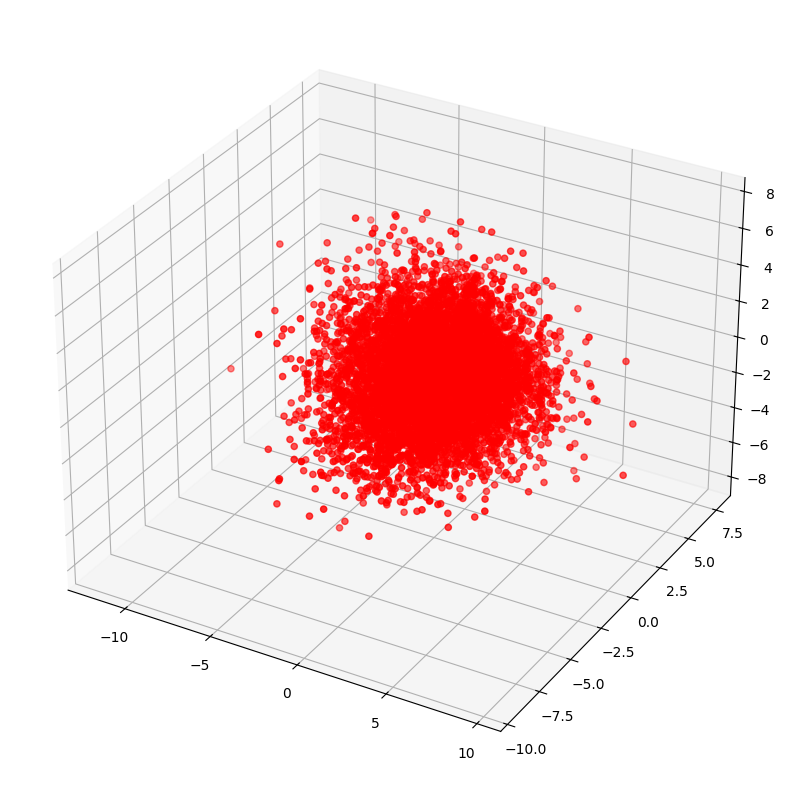

In [78]:
from sklearn.decomposition import PCA


pca_dataset = FaceDataset(dataset_path + f"128_aligned/images", current_transform)
pca_dataloader = DataLoader(pca_dataset, batch_size=32, shuffle=False)


features_list = []

celeb_features = {}

# with torch.no_grad():
#   for i, images in tqdm(enumerate(pca_dataloader)):
#     batch_start_index = i * pca_dataloader.batch_size
#     for j, image in enumerate(images):
#         img_index = batch_start_index + j
#         img_title = pca_dataset.image_files[img_index]
#         name = img_title.replace(".png", "").replace(f"128_", "").replace("-", " ")
#         image = image.to(device)
#         mu,_ = model.encode(image.unsqueeze(0))
#         celeb_features[name] = mu.cpu().numpy()
#         features_list.append(mu.cpu().numpy())
# features = np.concatenate(features_list)

# with open(models_path + 'celeb_features_vae_300_128.pck', 'wb') as fi:
#     pickle.dump(celeb_features, fi)


with open(models_path + 'celeb_features_vae_300_128.pck', 'rb') as fi:
    celeb_features = pickle.load(fi)

features = np.array(list(celeb_features.values()))
features = features.reshape(features.shape[0], features.shape[2])


pca = PCA(n_components=features_nb)
features_pca = pca.fit_transform(features)

# plot a 3D projection of features pca
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(features_pca[:, 0], features_pca[:, 1], features_pca[:, 2], c='r', marker='o')

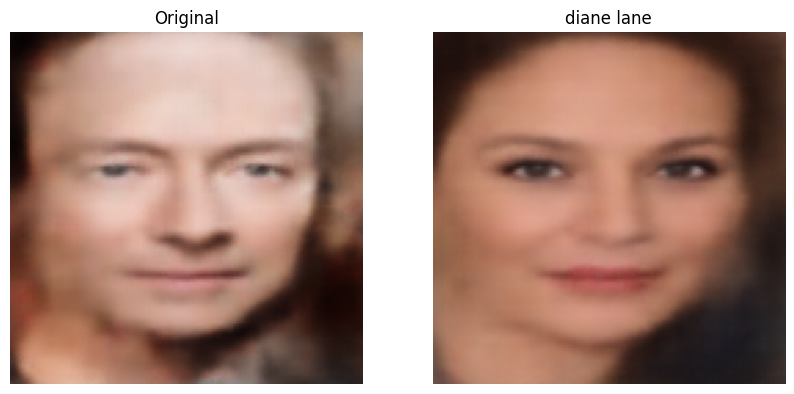

In [79]:
def plot_feature(f):
  if not isinstance(f, torch.Tensor):
    f = torch.from_numpy(f).to(device)
  with torch.no_grad():
      reconstruction = model.decode(f.to(device))
  reconstruction_image = reconstruction.squeeze(0).cpu().numpy().transpose(1, 2, 0)
  plt.imshow(reconstruction_image)
  plt.show()


def plot_two_features(f1, f2, t1="", t2=""):

  if not isinstance(f1, torch.Tensor):
    f1 = torch.from_numpy(f1).to(device)
  if not isinstance(f2, torch.Tensor):
    f2 = torch.from_numpy(f2).to(device)
  with torch.no_grad():
      reconstruction1 = model.decode(f1.to(device))
      reconstruction2 = model.decode(f2.to(device))

  reconstruction_image1 = reconstruction1.squeeze(0).cpu().numpy().transpose(1, 2, 0)
  reconstruction_image2 = reconstruction2.squeeze(0).cpu().numpy().transpose(1, 2, 0)

  fig, ax = plt.subplots(1, 2, figsize=(10, 5))
  ax[0].imshow(reconstruction_image1)
  ax[0].set_title(t1)
  ax[0].axis("off")
  ax[1].imshow(reconstruction_image2)
  ax[1].set_title(t2)
  ax[1].axis("off")
  plt.show()


mean_feature = np.mean(features, axis=0)
covariance_matrix_features = np.cov(features, rowvar=False)

def sample_feature():
    return torch.from_numpy(np.random.multivariate_normal(mean_feature, covariance_matrix_features).astype(np.float32)).to(device).unsqueeze(0)
    # return random feature_nb dimensional vector between 0 and 1 (for testing purposes if pca not available)
    # return torch.rand(features_nb).to(device).unsqueeze(0)


def find_closest_celeb(feature):
    if feature.dtype == torch.float32:
      feature = feature.cpu()
    min_dist = float('inf')
    closest_celeb = None
    closest_celeb_feature = None
    for name, celeb_feature in celeb_features.items():
        distance = np.linalg.norm(feature - celeb_feature)
        if distance < min_dist:
            min_dist = distance
            closest_celeb = name
            closest_celeb_feature = celeb_feature
    return closest_celeb, min_dist, closest_celeb_feature




f = sample_feature()
cf = find_closest_celeb(f)

plot_two_features(f, cf[2], "Original", cf[0])
# plot_feature(f)

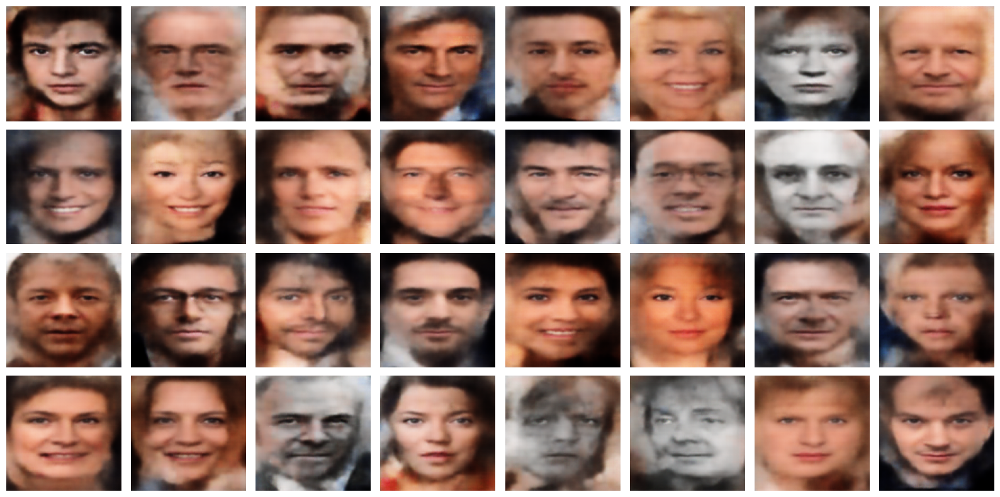

In [80]:
sampled_features = [sample_feature() for _ in range(32)]

# Reconstruct the sampled features
reconstructed_images = []
with torch.no_grad():
    for feature in sampled_features:
        reconstructed_image = model.decode(feature)
        reconstructed_images.append(reconstructed_image.squeeze(0).cpu().numpy().transpose(1, 2, 0))


# Plot the reconstructed faces in a 4x8 grid
fig, axes = plt.subplots(4, 8, figsize=(16, 8))
for i, ax in enumerate(axes.flat):
    ax.imshow(reconstructed_images[i])
    ax.axis('off')
plt.tight_layout()
plt.show()

In [90]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display


edit_img = Image.open(dataset_path + f"{img_size}_aligned/images/{img_size}_jean-dujardin.png").convert('RGB')
edit_img_tensor = current_transform(edit_img).unsqueeze(0).to(device)
_,edit_features,_ = model(edit_img_tensor)
edit_features_pca = pca.transform(edit_features.detach().cpu().numpy())

def edit_face(**dims):
  pca_features = edit_features_pca
  for i in dims:
    pca_features[0][int(i)] = dims[i]
  features = pca.inverse_transform(torch.from_numpy(pca_features))
  print(find_closest_celeb(features.detach().cpu().numpy())[0])
  with torch.no_grad():
      reconstruction = model.decode(features)
  reconstruction_image = reconstruction.squeeze(0).cpu().numpy().transpose(1, 2, 0)
  plt.imshow(reconstruction_image)
  plt.show()


dim_sliders = [widgets.FloatSlider(value=edit_features_pca[0][i], min=-8.0, max=8.0, step=0.01, description=f'Dimension {i}') for i in range(10)]
ui = VBox(dim_sliders)
# Define out such that it passes the list of dim_sliders to mix_image
out = widgets.interactive_output(edit_face, {str(i) : d for i,d in enumerate(dim_sliders)})
display(ui, out)

Output()